In [ ]:
!pip install torchmetrics

In [ ]:
!pip install facenet_pytorch

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 🔴 **Import Libs**

In [ ]:
import os
import random

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import cv2 as cv
import PIL
from PIL import Image

import sklearn
from sklearn.model_selection import train_test_split

import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader, random_split
from torch import optim
from torch.nn import functional as F

import torchvision
import torchvision.transforms as transforms
import torchvision.models as models
from torchvision.utils import make_grid

import tqdm
import torchmetrics as tm

import gc

In [ ]:
!python --version

Python 3.10.12


In [ ]:
for lib in [np, pd, cv, PIL, sklearn, torch, torchvision, tqdm, tm]:
  print(lib.__name__, '-->', lib.__version__)

numpy --> 1.23.5
pandas --> 1.5.3
cv2 --> 4.8.0
PIL --> 9.4.0
sklearn --> 1.2.2
torch --> 2.0.1+cu118
torchvision --> 0.15.2+cu118
tqdm --> 4.66.1
torchmetrics --> 1.1.1


# 🔴 **Utils**

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cpu'

In [ ]:
class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [ ]:
def num_trainable_params(model):
  nums = sum(p.numel() for p in model.parameters() if p.requires_grad)/1e6
  return nums

# 🔴 **Dataset**

## 🟠 **Copy & Unzip the Dataset**

In [ ]:
!cp /content/drive/MyDrive/UTKFace.tar.gz /content/

In [ ]:
!tar -xzf '/content/UTKFace.tar.gz' -C '/content/'

* x: This flag stands for "extract". It tells the tar command to extract the files from the archive.

* v: This flag stands for "verbose". It displays the list of files being extracted in the terminal.

* z: This flag indicates that the archive file is compressed using gzip.

* f: This flag indicates that the following argument is the name of the archive file.

## 🟠 EDA

### 🟡 Let's explore the images in the UTK dataset together!

🔰 Download the UFTK dataset to your computer:


*   explore it
*   then list five observations or interesting characteristics you find in the dataset.



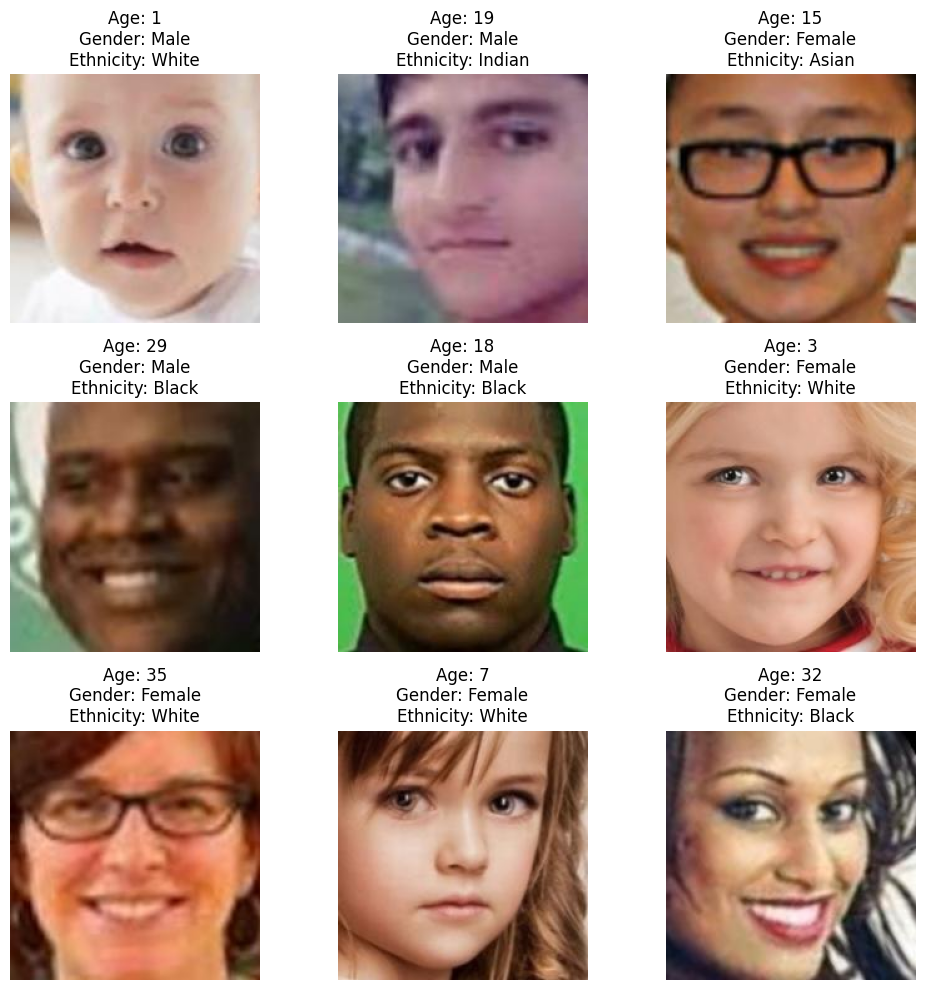

In [ ]:
# Replace with the actual path to your UTK dataset images folder
dataset_folder = '/content/UTKFace/'

def show_random_samples(num_samples=9):
    image_files = os.listdir(dataset_folder)
    selected_image_files = random.sample(image_files, num_samples)

    plt.figure(figsize=(10, 10))
    for idx, image_file in enumerate(selected_image_files, 1):
        image_path = os.path.join(dataset_folder, image_file)
        age, gender, ethnicity = image_file.split('_')[:3]

        image = Image.open(image_path)

        gender = 'Male' if int(gender) == 0 else 'Female'
        ethnicity = ['White', 'Black', 'Asian', 'Indian', 'Others'][int(ethnicity)]

        plt.subplot(3, 3, idx)
        plt.imshow(image)
        plt.title(f"Age: {age}\nGender: {gender}\nEthnicity: {ethnicity}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Call the function to display random samples
show_random_samples()


### 🟡 Create a csv file which contains labels

🔰 During this session, your mission is to:
   

*   create the following DataFrame
*   and save it as a CSV file named 'utkface_dataset.csv'


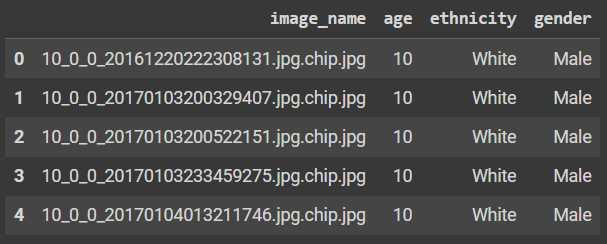

In [ ]:
image_ids    = os.listdir(dataset_folder)

image_names  = []
ages         = []
genders      = []
ethnicities = []

for i in range(len(image_ids)):
  l = []

  if len(image_ids[i].split('_')) == 4 and '' not in image_ids[i].split('_'):
    age, gender, ethnicity = image_ids[i].split('_')[:3]
    gender = 'Male' if int(gender) == 0 else 'Female'
    ethnicity = ['White', 'Black', 'Asian', 'Indian', 'Others'][int(ethnicity)]

    if int(age)>80:
      continue

    image_names.append(image_ids[i])
    ages.append(int(age))
    genders.append(gender)
    ethnicities.append(ethnicity)
  else:
    print(image_ids[i])


39_1_20170116174525125.jpg.chip.jpg
61_1_20170109150557335.jpg.chip.jpg
61_1_20170109142408075.jpg.chip.jpg


In [ ]:
len(image_names), len(ages), len(genders), len(ethnicities)

(23165, 23165, 23165, 23165)

In [ ]:
csv_file               = pd.DataFrame(data = image_names, columns = ['image_name'])
csv_file['age']        = ages
csv_file['gender']     = genders
csv_file['ethnicity'] = ethnicities
csv_file

,image_name,age,gender,ethnicity
0,26_1_3_20170117154821244.jpg.chip.jpg,26,Female,Indian
1,36_0_3_20170119201817701.jpg.chip.jpg,36,Male,Indian
2,20_1_4_20161223230110540.jpg.chip.jpg,20,Female,Others
3,2_1_0_20170109194125822.jpg.chip.jpg,2,Female,White
4,45_0_0_20170117185742546.jpg.chip.jpg,45,Male,White
...,...,...,...,...
23160,58_1_1_20170113000640931.jpg.chip.jpg,58,Female,Black
23161,54_0_3_20170119200516380.jpg.chip.jpg,54,Male,Indian
23162,24_1_0_20170116214224254.jpg.chip.jpg,24,Female,White
23163,58_0_1_20170117184831471.jpg.chip.jpg,58,Male,Black


### 🟡 Plot histogram for age

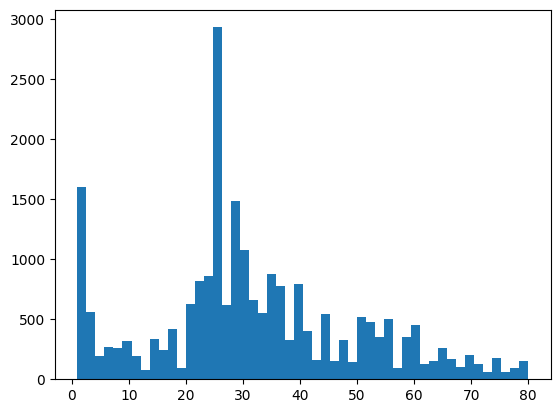

In [ ]:
plt.hist(csv_file['age'], bins = 50)
plt.show()

In [ ]:
csv_file.age.describe()

count    23165.000000
mean        32.024218
std         18.227409
min          1.000000
25%         23.000000
50%         29.000000
75%         42.000000
max         80.000000
Name: age, dtype: float64

#### 🛑 **Tip:** You can use Plotly or Seaborn libraries to create visually appealing plots!

### 🟡 Plot histogram for gender

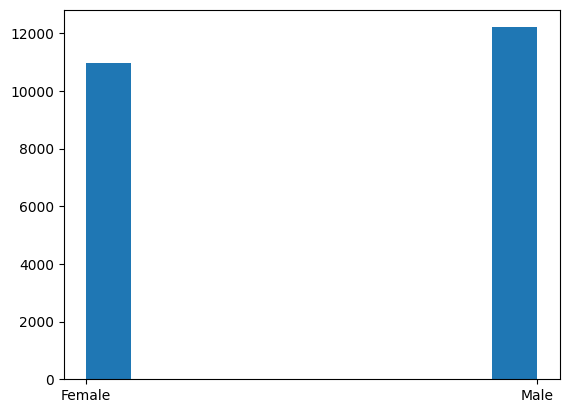

In [ ]:
plt.hist(csv_file['gender'])
plt.show()

### 🟡 Plot histogram for ethnicity

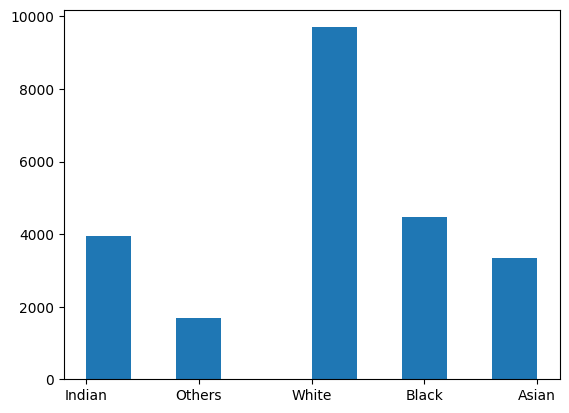

In [ ]:
plt.hist(csv_file['ethnicity'])
plt.show()

### 🟡 Calculate the cross-tabulation of gender and ethnicity using the pandas.crosstab() function.

In [ ]:
pd.crosstab(csv_file['gender'], csv_file['ethnicity'])

ethnicity,Asian,Black,Indian,Others,White
gender,,,,,
Female,1810,2182,1698,930,4337
Male,1538,2296,2254,759,5361


### 🟡 Create violin plots and box plots for age, separately for men and women.

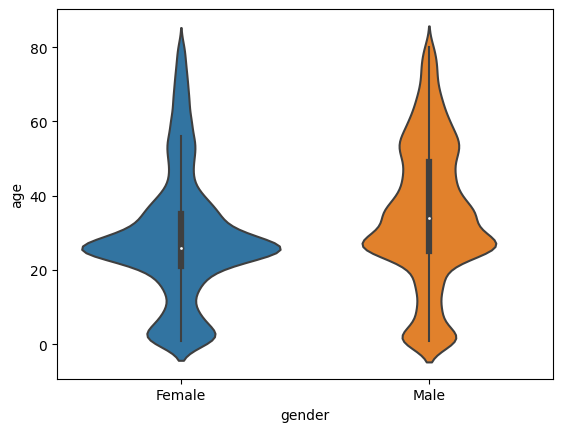

In [ ]:
sns.violinplot(csv_file, x = 'gender', y = 'age')
plt.show()


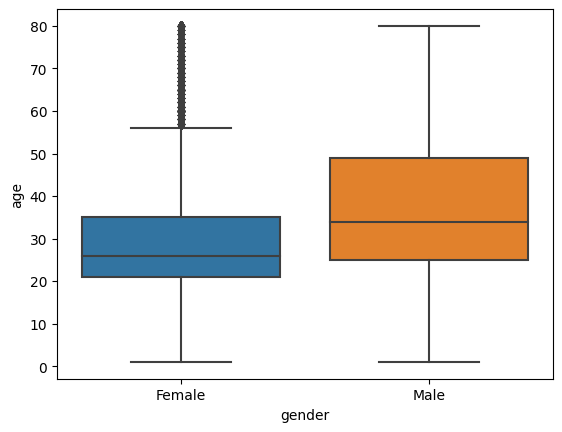

In [ ]:
sns.boxplot(csv_file, x = 'gender', y = 'age')
plt.show()

### 🟡 Create violin plots and box plots for age, separately for each ethnicity.

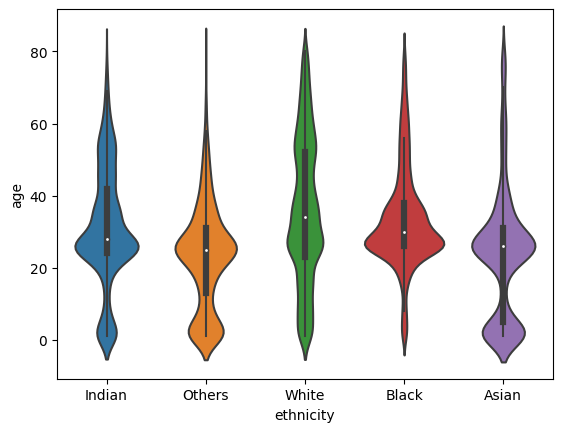

In [ ]:
sns.violinplot(csv_file, x = 'ethnicity', y = 'age')
plt.show()

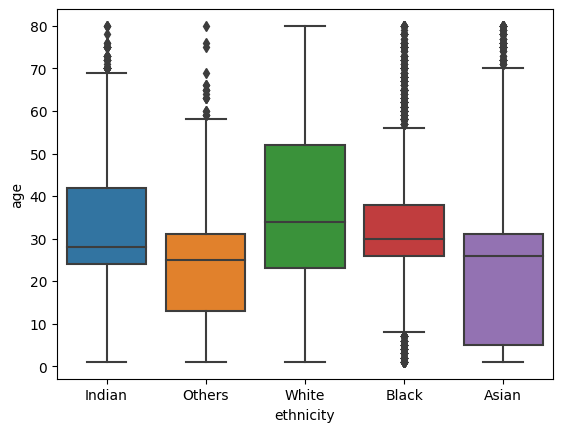

In [ ]:
sns.boxplot(csv_file, x = 'ethnicity', y = 'age')
plt.show()

## 🟠 Split datasets

🔰 During this session, your task is to use scikit-learn's train_test_split function to partition the dataset into training, validation, and test sets.

In [ ]:
df_train, df_test  = train_test_split(csv_file, test_size = 0.3, stratify = csv_file.age, random_state = 42)
df_test, df_valid = train_test_split(df_test, test_size = 0.5, stratify = df_test.age, random_state = 42)
len(df_train), len(df_valid), len(df_test)

(16215, 3475, 3475)

###🟡 Plot histograms for age in the training, validation, and test sets.

⛔️ **Warning:** Ensure that the distributions of the training, validation, and test sets are similar.

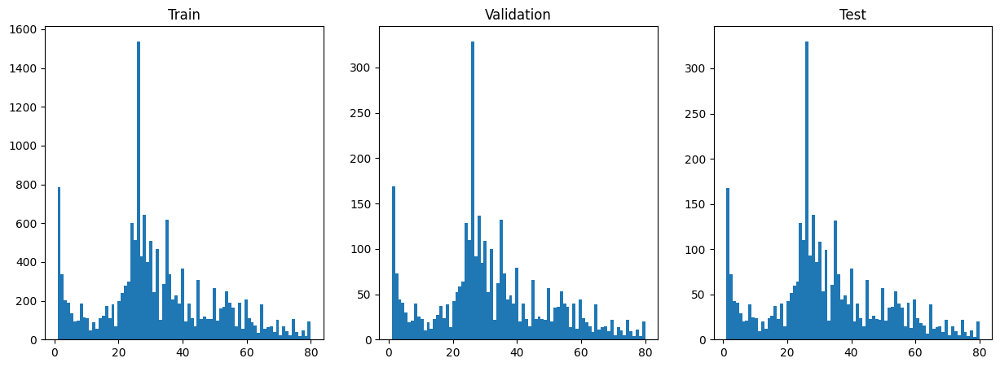

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].hist(df_train.age, bins=len(df_train.age.unique())); axes[0].set_title('Train')
axes[1].hist(df_valid.age, bins=len(df_valid.age.unique())); axes[1].set_title('Validation')
axes[2].hist(df_test.age, bins=len(df_test.age.unique())); axes[2].set_title('Test');

### 🟡 Save the training, validation, and test sets in separate CSV files.

In [ ]:
df_train.to_csv('/content/train_set.csv', index=False)
df_valid.to_csv('/content/valid_set.csv', index=False)
df_test.to_csv('/content/test_set.csv', index=False)

print('All CSV files created successfully.')

All CSV files created successfully.


## 🟠 Define transformations

🔰 During this session, your mission is to implement a data transformation pipeline using PyTorch's transforms.
The transformations should include:

*   Resizing images to a resolution of 128x128 pixels.
*   Applying random horizontal flips to the images.
*   Introducing random rotations of 15 degrees.
*   Adjusting image color using the ColorJitter transformation.
*   Converting the images to tensors.
*   Normalizing the pixel values using the provided mean and standard deviation values `(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])`.

In [ ]:
train_transforms = transforms.Compose([transforms.Resize(size = (128, 128)),
                                       transforms.RandomHorizontalFlip(),
                                       transforms.RandomRotation(degrees = 15),
                                       transforms.ColorJitter(brightness = 0.2, contrast = 0.2, saturation = 0.2, hue = 0.1),
                                       transforms.ToTensor(),
                                       transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

## 🟠 Custom dataset

🔰 Write a custom dataset class for UTKFace.

In [ ]:
class UTKDataset(Dataset):

    def __init__(self, root_dir, phase, transform=None):

       self.root_dir  = root_dir
       self.transform = transform
       self.data      = pd.read_csv('/content/'+ f'{phase}_set.csv')

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):

        image_path = self.data['image_name'][idx]
        image_pil  = Image.open(self.root_dir + image_path).convert('RGB')
        age        = torch.tensor(self.data['age'][idx]).unsqueeze(-1)
        gender     = self.data['gender'][idx]
        ethnicity  = self.data['ethnicity'][idx]

        if self.transform is None:
          image = transforms.Compose([transforms.Resize(size = (128, 128)),
                                      transforms.ToTensor(),
                                      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])(image_pil)

        else:
          image = self.transform(image_pil)

        return image, age, gender, ethnicity

🔰 Utilize the UTKDataset class you've created to instantiate dataset objects for the training, validation, and test sets.

In [ ]:
train_dataset = UTKDataset('/content/UTKFace/', 'train', train_transforms)
valid_dataset = UTKDataset('/content/UTKFace/', 'valid', None)
test_dataset  = UTKDataset('/content/UTKFace/', 'test', None)

In [ ]:
len(train_dataset), len(valid_dataset), len(test_dataset)

(16215, 3475, 3475)

🔰 Plot a few images to verify the functionality of the dataset objects.

In [ ]:
def get_images(dataset, num = 10):
  images = dataset[torch.randint(0, len(dataset), (1, )).item()][0].unsqueeze(0)
  for i in range(num - 1):
    r     = torch.randint(0, len(dataset), (1, )).item()
    image = dataset[r][0]

    images = torch.cat((image.unsqueeze(0), images), dim = 0)
  return images

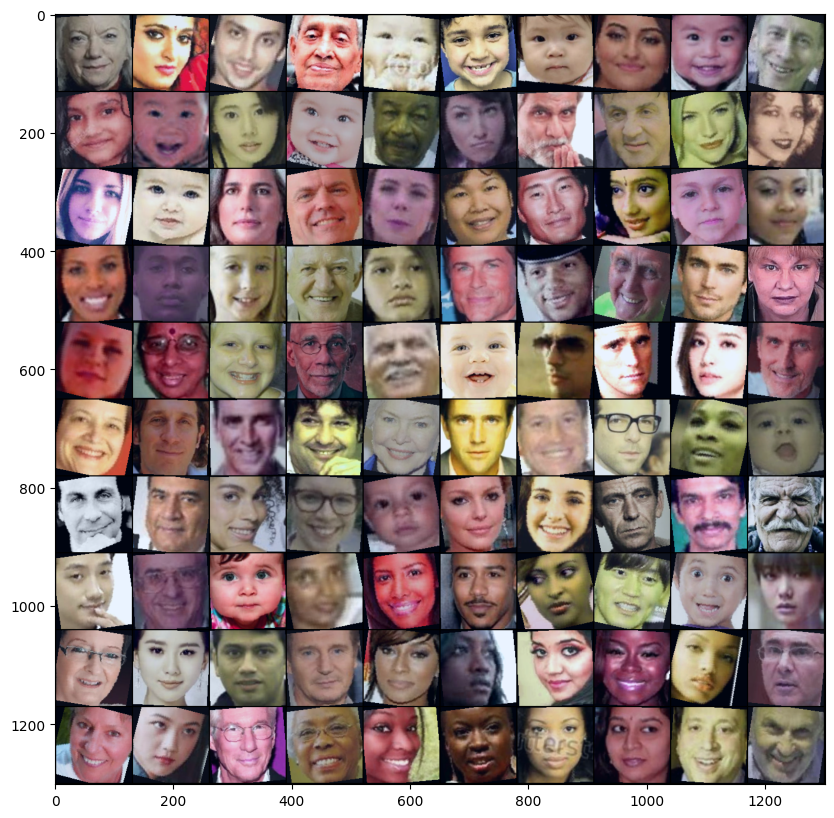

In [ ]:
images = get_images(train_dataset, 100)
images_grid = make_grid(images, nrow = 10, normalize = True).permute(1, 2, 0)
plt.figure(figsize = (10, 10))
plt.imshow(images_grid)

## 🟠 Define dataloader

🔰 Write dataloaders for the training, validation, and test sets.

In [ ]:
train_loader = DataLoader(train_dataset, batch_size = 128, shuffle = True )
valid_loader = DataLoader(valid_dataset, batch_size = 128, shuffle = False)
test_loader  = DataLoader(test_dataset, batch_size  = 128, shuffle = False)

🔰 Test the dataloaders using `next(iter())`

In [ ]:
a, b, c, d = next(iter(train_loader))
a.shape, b.shape, len(c), len(d)

(torch.Size([128, 3, 128, 128]), torch.Size([128, 1]), 128, 128)

In [ ]:
a, b, c, d = next(iter(valid_loader))
a.shape, b.shape, len(c), len(d)

(torch.Size([128, 3, 128, 128]), torch.Size([128, 1]), 128, 128)

In [ ]:
a, b, c, d = next(iter(test_loader))
a.shape, b.shape, len(c), len(d)

(torch.Size([128, 3, 128, 128]), torch.Size([128, 1]), 128, 128)

# 🔵 **Dataset CACD2000**

In [ ]:
!cp /content/drive/MyDrive/CACD2000.tar.gz /content/

In [ ]:
!tar -xzf /content/CACD2000.tar.gz -C /content/

In [ ]:
dataset_folder = '/content/CACD2000/'

In [ ]:
image_ids    = os.listdir(dataset_folder)

image_names  = []
ages         = []

for i in range(len(image_ids)):
    l = []

    age= image_ids[i].split('_')[0]

    image_names.append(image_ids[i])
    ages.append(int(age))


In [ ]:
csv_file_cacd2000               = pd.DataFrame(data = image_names, columns = ['image_name'])
csv_file_cacd2000['age']        = ages
csv_file_cacd2000

,image_name,age
0,28_Ben_Foster_0011.jpg,28
1,46_Steven_Soderbergh_0011.jpg,46
2,37_Zach_Braff_0008.jpg,37
3,36_Emma_Caulfield_0010.jpg,36
4,55_Alec_Baldwin_0001.jpg,55
...,...,...
163441,27_Zachary_Quinto_0010.jpg,27
163442,30_Rebecca_Ferguson_0006.jpg,30
163443,32_Ashton_Kutcher_0011.jpg,32
163444,35_Sam_Worthington_0016.jpg,35


In [ ]:
df_train_cacd2000, df_test_cacd2000  = train_test_split(csv_file_cacd2000, test_size = 0.3, stratify = csv_file_cacd2000.age, random_state = 42)
df_test_cacd2000, df_valid_cacd2000 = train_test_split(df_test_cacd2000, test_size = 0.5, stratify = df_test_cacd2000.age, random_state = 42)
len(df_train_cacd2000), len(df_valid_cacd2000), len(df_test_cacd2000)

(114412, 24517, 24517)

In [ ]:
df_train_cacd2000.to_csv('/content/train_set_cacd2000.csv', index=False)
df_valid_cacd2000.to_csv('/content/valid_set_cacd2000.csv', index=False)
df_test_cacd2000.to_csv('/content/test_set_cacd2000.csv', index=False)

print('All CSV files created successfully.')

All CSV files created successfully.


In [ ]:
train_transforms = transforms.Compose([transforms.Resize(size = (128, 128)),
                                       transforms.RandomHorizontalFlip(),
                                       transforms.RandomRotation(degrees = 15),
                                       transforms.ColorJitter(brightness = 0.2, contrast = 0.2, saturation = 0.2, hue = 0.1),
                                       transforms.ToTensor(),
                                       transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

In [ ]:
class CACD2000Dataset(Dataset):

    def __init__(self, root_dir, phase, transform=None):

       self.root_dir  = root_dir
       self.transform = transform
       self.data      = pd.read_csv('/content/'+ f'{phase}_set_cacd2000.csv')

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):

        image_path = self.data['image_name'][idx]
        image_pil  = Image.open(self.root_dir + image_path).convert('RGB')
        age        = torch.tensor(self.data['age'][idx]).unsqueeze(-1)

        if self.transform is None:
          image = transforms.Compose([transforms.Resize(size = (128, 128)),
                                      transforms.ToTensor(),
                                      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])(image_pil)

        else:
          image = self.transform(image_pil)

        return image, age, 1, 1

In [ ]:
train_dataset_cacd2000  = CACD2000Dataset('/content/CACD2000/', 'train', train_transforms)
valid_dataset_cacd2000  = CACD2000Dataset('/content/CACD2000/', 'valid', None)
test_dataset_cacd2000   = CACD2000Dataset('/content/CACD2000/', 'test', None)

In [ ]:
len(train_dataset_cacd2000), len(valid_dataset_cacd2000), len(test_dataset_cacd2000)

(114412, 24517, 24517)

In [ ]:
def get_images(dataset, num = 10):
  images = dataset[torch.randint(0, len(dataset), (1, )).item()][0].unsqueeze(0)
  for i in range(num - 1):
    r     = torch.randint(0, len(dataset), (1, )).item()
    image = dataset[r][0]

    images = torch.cat((image.unsqueeze(0), images), dim = 0)
  return images

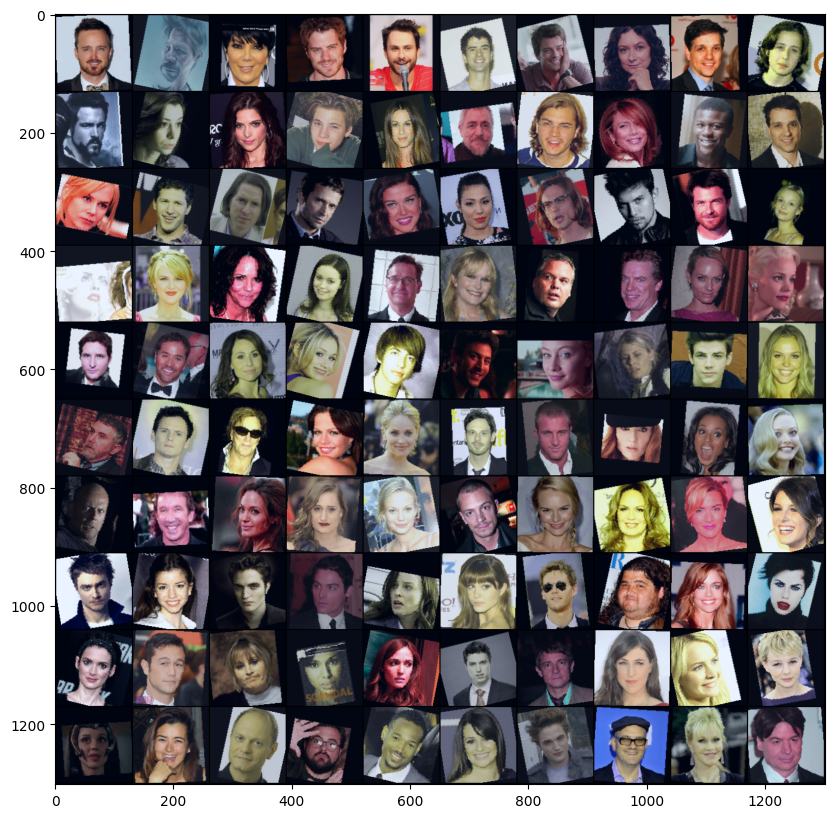

In [ ]:
images = get_images(train_dataset_cacd2000, 100)
images_grid = make_grid(images, nrow = 10, normalize = True).permute(1, 2, 0)
plt.figure(figsize = (10, 10))
plt.imshow(images_grid)

In [ ]:
train_loader_cacd2000 = DataLoader(train_dataset_cacd2000, batch_size = 16, shuffle = True )
valid_loader_cacd2000 = DataLoader(valid_dataset_cacd2000, batch_size = 32, shuffle = False)
test_loader_cacd2000  = DataLoader(test_dataset_cacd2000, batch_size  = 128, shuffle = False)

In [ ]:
a, b, _, _ = next(iter(train_loader_cacd2000))
a.shape, b.shape

(torch.Size([16, 3, 128, 128]), torch.Size([16, 1]))

# 🔵 **Dataset MegaAge**

In [ ]:
!cp /content/drive/MyDrive/megaage\ \(1\).zip /content/

In [ ]:
!unzip /content/megaage\ \(1\).zip

In [ ]:
train_transforms = transforms.Compose([transforms.Resize(size = (128, 128)),
                                       transforms.RandomHorizontalFlip(),
                                       transforms.RandomRotation(degrees = 15),
                                       transforms.ColorJitter(brightness = 0.2, contrast = 0.2, saturation = 0.2, hue = 0.1),
                                       transforms.ToTensor(),
                                       transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

In [ ]:
class MegaAgeDataset(Dataset):

  def __init__(self, root_dir, phase, transform=None):

    self.root_dir  = root_dir
    self.phase     = phase
    self.transform = transform

    self.image_names = np.loadtxt(self.root_dir + f'list/{phase}_name.txt', dtype = 'str')
    self.ages        = np.loadtxt(self.root_dir + f'list/{phase}_age.txt', dtype = 'str')

  def __getitem__(self, index):

    image_path   = self.root_dir + f'{self.phase}/' + self.image_names[index]
    image_pil    = Image.open(image_path)

    if self.transform:
      image = self.transform(image_pil)

    else:
      image = transforms.Compose([transforms.Resize(size = (128, 128)),
                                       transforms.ToTensor(),
                                       transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])(image_pil)

    age = torch.tensor(int(self.ages[index])).unsqueeze(0)

    return image, age, 1, 1

  def __len__(self):
    return len(self.ages)

In [ ]:
train_dataset_megaage = MegaAgeDataset('/content/megaage/', 'train', train_transforms)
test_dataset_megaage  = MegaAgeDataset('/content/megaage/', 'test', None)

In [ ]:
test_dataset_megaage, valid_dataset_megaage = random_split(test_dataset_megaage, (4265, len(test_dataset_megaage) - 4265))

In [ ]:
len(train_dataset_megaage), len(test_dataset_megaage), len(valid_dataset_megaage)

(33411, 4265, 4265)

In [ ]:
def get_images(dataset, num = 10):
  images = dataset[torch.randint(0, len(dataset), (1, )).item()][0].unsqueeze(0)
  for i in range(num - 1):
    r     = torch.randint(0, len(dataset), (1, )).item()
    image = dataset[r][0]

    images = torch.cat((image.unsqueeze(0), images), dim = 0)
  return images

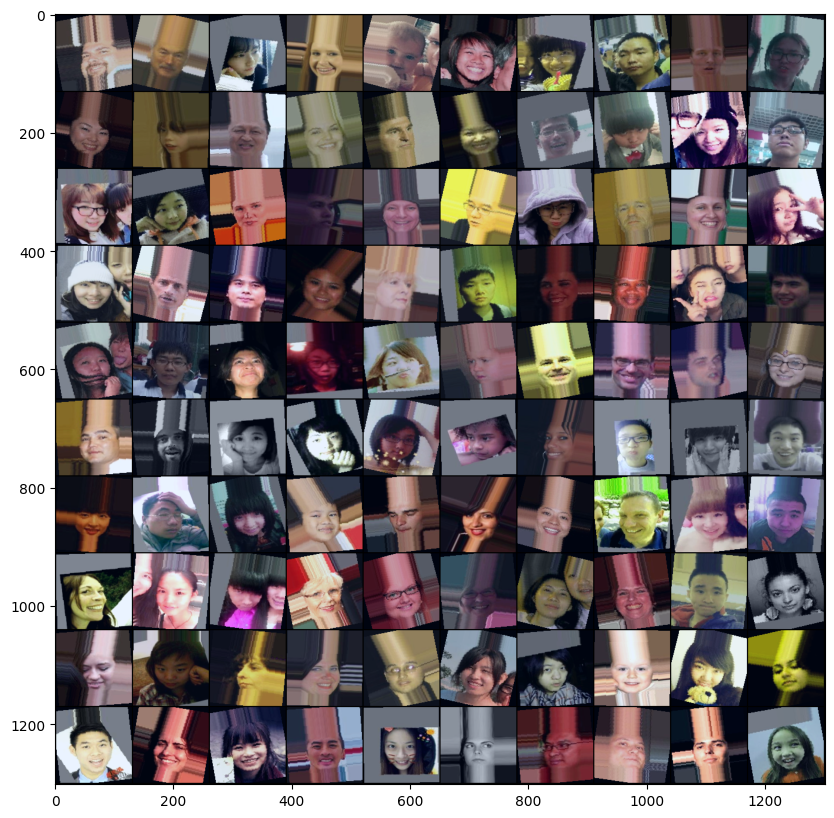

In [ ]:
images = get_images(train_dataset_megaage, 100)
images_grid = make_grid(images, nrow = 10, normalize = True).permute(1, 2, 0)
plt.figure(figsize = (10, 10))
plt.imshow(images_grid)

In [ ]:
train_loader_megaage = DataLoader(train_dataset_megaage, batch_size = 128, shuffle = True)
valid_loader_megaage = DataLoader(valid_dataset_megaage, batch_size = 128, shuffle = False)
test_loader_megaage  = DataLoader(test_dataset_megaage, batch_size  = 128, shuffle = False)

In [ ]:
a, b, _, _ = next(iter(train_loader_megaage))
a.shape, b.shape

(torch.Size([128, 3, 128, 128]), torch.Size([128, 1]))

In [ ]:
a, b, _, _ = next(iter(valid_loader_megaage))
a.shape, b.shape

(torch.Size([128, 3, 128, 128]), torch.Size([128, 1]))

In [ ]:
a, b, _, _ = next(iter(test_loader_megaage))
a.shape, b.shape

(torch.Size([128, 3, 128, 128]), torch.Size([128, 1]))

# 🔴 **Model**

🔰 Use the following template to create a custom model employing the ResNet-50 architecture

In [ ]:
model    = models.resnet50(True)
model.fc = torch.nn.Linear(2048, 1)
model    = model.to(device)

In [ ]:
num_trainable_params(model)

In [ ]:
class AgeEstimationModel(torch.nn.Module):

  def __init__(self):
    super(AgeEstimationModel, self).__init__()

    self.resnet    = models.resnet50(True)
    self.resnet.fc = torch.nn.Linear(2048, 1)
    #or
    #self.resnet   = models.resnet50(True)
    #self.resnet.fc= torch.nn.Identity()
    #self.fc       = torch.nn.Linear(2048, 1)


  def forward(self, x):

    y = self.resnet(x)

    return y


🔰 Create an object for model using the AgeEstimationModel class you've created.

In [ ]:
model = AgeEstimationModel().to(device)

In [ ]:
model(torch.rand(1, 3, 128, 128).to(device)).shape

In [ ]:
num_trainable_params(model)

# 🔴 **Config**

🔰 Define the optimizer, loss function, and metrics in this section, and ensure the model is sent to the appropriate device.

In [ ]:
optimizer = torch.optim.SGD(model.parameters(), lr = 0.001, momentum = 0.9)
loss_func = torch.nn.L1Loss()
metric    = torch.nn.L1Loss()

# 🔴 **Train ➰**

🔰Write the train function.

In [ ]:
def train_one_epoch(model, train_loader, loss_fn, optimizer, metric, epoch=None):
  model.train()
  #metric.reset()

  loss_train = AverageMeter()

  with tqdm.tqdm(train_loader, unit = 'batch') as tepoch:
    for image, age, _, _ in tepoch:
      if epoch is not None:
        tepoch.set_description(f'Epoch:{epoch}')

      image = image.to(device)
      age   = age.to(device)

      age_pred = model(image)

      loss = loss_fn(age_pred, age)

      loss.backward()
      optimizer.step()
      optimizer.zero_grad()

      loss_train.update(loss)
      #metric.update(age_pred, age)

      gc.collect()

      tepoch.set_postfix(loss = loss_train.avg.item()) #metric = metric.compute().item())

  return model, loss_train.avg.item()#, metric.compute().item()

# 🔴 **Evaluation ➰**

🔰Write the evaluation function.

In [ ]:
def evaluate(model, data_loader, loss_fn, metric):
  model.eval()
  #metric.reset()

  loss_valid = AverageMeter()

  for image, age, _, _ in data_loader:

    image = image.to(device)
    age   = age.to(device)

    with torch.no_grad():
      age_pred = model(image)

    loss = loss_fn(age_pred, age)
    loss_valid.update(loss)
    #metric.update(age_pred, age)

  print(f'Loss : {loss_valid.avg.item()}')#, Metric : {metric.compute().item()}')

  return loss_valid.avg.item()#, metric.compute().item()

# 🔴 **Training Process 〽️**

## 🟠 Finding Hyper-parameters

### 🟡 **Step 1:** Calculate the loss for an untrained model using a few batches.


In [ ]:
image, age, _, _ = next(iter(train_loader))
age_pred = model(image.to(device))
loss_func(age_pred, age.to(device)).item()

6.795310020446777

### 🟡 **Step 2:** Try to train and overfit the model on a small subset of the dataset.

In [ ]:
sub_dataset, _ = random_split(train_dataset, (100, len(train_dataset) - 100))
len(sub_dataset)

100

In [ ]:
sub_loader = DataLoader(sub_dataset, batch_size = 16, shuffle = True, num_workers = 2)

In [ ]:
model = AgeEstimationModel().to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
optimizer = torch.optim.SGD(model.parameters(), lr = 0.01, momentum = 0.9)
loss_func = torch.nn.L1Loss()

In [ ]:
for i in range(10):
  model, _ = train_one_epoch(model, sub_loader, loss_func, optimizer, metric, i)

Epoch:9: 100%|██████████| 7/7 [00:00<00:00,  8.64batch/s, loss=16.5]


### 🟡 **Step 3:** Train the model for a limited number of epochs, experimenting with various learning rates.

In [ ]:
lr_list = [0.5, 0.1, 0.01, 0.001, 0.0001, 0.00001]
result  = []
for lr in lr_list:
  print(f'LR = {lr}')
  sub_result = []
  model = AgeEstimationModel().to(device)
  optimizer = torch.optim.SGD(model.parameters(), lr = lr, momentum = 0.9)
  loss_func = torch.nn.L1Loss()
  for i in range(5):
    model, train_loss = train_one_epoch(model, train_loader, loss_func, optimizer, metric, i)
    if i == 0:
      sub_result.append(train_loss)
    if i == 4:
      sub_result.append(train_loss)
  result.append(sub_result)
  print('---------------------------------------------')


LR = 0.5


Epoch:4: 100%|██████████| 127/127 [01:26<00:00,  1.47batch/s, loss=13.9]


---------------------------------------------
LR = 0.1


Epoch:4: 100%|██████████| 127/127 [01:27<00:00,  1.45batch/s, loss=9.15]


---------------------------------------------
LR = 0.01


Epoch:4: 100%|██████████| 127/127 [01:29<00:00,  1.42batch/s, loss=6.25]


---------------------------------------------
LR = 0.001


Epoch:4: 100%|██████████| 127/127 [01:28<00:00,  1.44batch/s, loss=4.92]


---------------------------------------------
LR = 0.0001


Epoch:4: 100%|██████████| 127/127 [01:27<00:00,  1.45batch/s, loss=5.73]


---------------------------------------------
LR = 1e-05


Epoch:4: 100%|██████████| 127/127 [01:32<00:00,  1.37batch/s, loss=15.2]

---------------------------------------------


In [ ]:
pd.DataFrame(result, index = lr_list, columns = ['start', 'stop'])

,start,stop
0.50000,17.715227,13.906586
0.10000,15.021024,9.153139
0.01000,10.387985,6.245297
0.00100,9.617663,4.919350
0.00010,17.984013,5.726653
0.00001,30.271423,15.191947


### 🟡 Step 4: Create a small grid using the weight decay and the best learning rate.





In [ ]:
lr_list = [0.0005, 0.001]
wd_list = [0, 0.001, 1e-4, 1e-5, 1e-6]
result  = []
indexes = []

for lr in lr_list:
  for wd in wd_list:

    print(f'LR = {lr}, Weight_decay = {wd}')
    indexes.append(f'LR = {lr}, Weight_decay = {wd}')

    sub_result = []

    model = AgeEstimationModel().to(device)
    optimizer = torch.optim.SGD(model.parameters(), lr = lr, momentum = 0.9, weight_decay = wd)
    loss_func = torch.nn.L1Loss()
    metric    = tm.MeanAbsoluteError().to(device)

    for i in range(5):
      model, train_loss, metric_train = train_one_epoch(model, train_loader, loss_func, optimizer, metric, i)
      valid_loss, metric_valid        = evaluate(model, valid_loader, loss_func, metric)

      if i == 0:
        sub_result.append(train_loss)
        sub_result.append(valid_loss)
      if i == 4:
        sub_result.append(train_loss)
        sub_result.append(valid_loss)

    result.append(sub_result)
    torch.save(model, f'/content/models-step4/model*{lr}*{wd}.pt')
    print('model saved!')
    print('---------------------------------------------')

LR = 0.0005, Weight_decay = 0


Epoch:0: 100%|██████████| 127/127 [02:00<00:00,  1.06batch/s, loss=10.7, metric=10.7]


Loss : 6.9791646003723145, Metric : 7.065711975097656


Epoch:1: 100%|██████████| 127/127 [02:01<00:00,  1.04batch/s, loss=5.97, metric=5.97]


Loss : 5.40627908706665, Metric : 5.48549747467041


Epoch:2: 100%|██████████| 127/127 [02:00<00:00,  1.05batch/s, loss=5.45, metric=5.45]


Loss : 5.1601457595825195, Metric : 5.226904392242432


Epoch:3: 100%|██████████| 127/127 [01:59<00:00,  1.06batch/s, loss=5.14, metric=5.14]


Loss : 5.070719242095947, Metric : 5.120485782623291


Epoch:4: 100%|██████████| 127/127 [02:00<00:00,  1.05batch/s, loss=4.85, metric=4.85]


Loss : 5.057095527648926, Metric : 5.10582971572876
model saved!
---------------------------------------------
LR = 0.0005, Weight_decay = 0.001


Epoch:0: 100%|██████████| 127/127 [01:59<00:00,  1.06batch/s, loss=10.7, metric=10.7]


Loss : 6.460537433624268, Metric : 6.5435099601745605


Epoch:1: 100%|██████████| 127/127 [02:00<00:00,  1.05batch/s, loss=6.07, metric=6.07]


Loss : 5.564051151275635, Metric : 5.632907390594482


Epoch:2: 100%|██████████| 127/127 [02:00<00:00,  1.05batch/s, loss=5.5, metric=5.5]


Loss : 5.382963180541992, Metric : 5.462960243225098


Epoch:3: 100%|██████████| 127/127 [02:00<00:00,  1.05batch/s, loss=5.19, metric=5.19]


Loss : 5.349706172943115, Metric : 5.385252475738525


Epoch:4: 100%|██████████| 127/127 [02:01<00:00,  1.05batch/s, loss=4.92, metric=4.92]


Loss : 4.961259365081787, Metric : 5.009117126464844
model saved!
---------------------------------------------
LR = 0.0005, Weight_decay = 0.0001


Epoch:0: 100%|██████████| 127/127 [01:59<00:00,  1.06batch/s, loss=10.7, metric=10.7]


Loss : 6.128549098968506, Metric : 6.195539951324463


Epoch:1: 100%|██████████| 127/127 [02:01<00:00,  1.05batch/s, loss=5.96, metric=5.96]


Loss : 5.253457069396973, Metric : 5.303650379180908


Epoch:2: 100%|██████████| 127/127 [01:59<00:00,  1.06batch/s, loss=5.46, metric=5.46]


Loss : 5.080745697021484, Metric : 5.131141662597656


Epoch:3: 100%|██████████| 127/127 [02:00<00:00,  1.05batch/s, loss=5.09, metric=5.09]


Loss : 5.04726505279541, Metric : 5.093067169189453


Epoch:4: 100%|██████████| 127/127 [01:58<00:00,  1.07batch/s, loss=4.91, metric=4.91]


Loss : 4.98253870010376, Metric : 5.007439136505127
model saved!
---------------------------------------------
LR = 0.0005, Weight_decay = 1e-05


Epoch:0: 100%|██████████| 127/127 [02:01<00:00,  1.05batch/s, loss=10.5, metric=10.6]


Loss : 6.294285297393799, Metric : 6.366004467010498


Epoch:1: 100%|██████████| 127/127 [02:02<00:00,  1.04batch/s, loss=6.04, metric=6.05]


Loss : 5.435074806213379, Metric : 5.501285552978516


Epoch:2: 100%|██████████| 127/127 [02:00<00:00,  1.05batch/s, loss=5.46, metric=5.46]


Loss : 5.173301696777344, Metric : 5.2061357498168945


Epoch:3: 100%|██████████| 127/127 [01:59<00:00,  1.06batch/s, loss=5.17, metric=5.17]


Loss : 4.980659484863281, Metric : 5.020644187927246


Epoch:4: 100%|██████████| 127/127 [02:00<00:00,  1.06batch/s, loss=4.87, metric=4.87]


Loss : 4.9523725509643555, Metric : 5.016931056976318
model saved!
---------------------------------------------
LR = 0.0005, Weight_decay = 1e-06


Epoch:0: 100%|██████████| 127/127 [01:59<00:00,  1.06batch/s, loss=10.7, metric=10.7]


Loss : 6.539959907531738, Metric : 6.59160852432251


Epoch:1: 100%|██████████| 127/127 [02:00<00:00,  1.05batch/s, loss=6.05, metric=6.05]


Loss : 5.4169535636901855, Metric : 5.476230144500732


Epoch:2: 100%|██████████| 127/127 [01:59<00:00,  1.06batch/s, loss=5.48, metric=5.48]


Loss : 6.091317653656006, Metric : 6.143947124481201


Epoch:3: 100%|██████████| 127/127 [02:00<00:00,  1.05batch/s, loss=5.15, metric=5.15]


Loss : 5.17175817489624, Metric : 5.186948299407959


Epoch:4: 100%|██████████| 127/127 [02:00<00:00,  1.06batch/s, loss=4.89, metric=4.89]


Loss : 4.974768161773682, Metric : 5.001953601837158
model saved!
---------------------------------------------
LR = 0.001, Weight_decay = 0


Epoch:0: 100%|██████████| 127/127 [01:59<00:00,  1.06batch/s, loss=9.51, metric=9.51]


Loss : 6.238607406616211, Metric : 6.331734657287598


Epoch:1: 100%|██████████| 127/127 [01:59<00:00,  1.06batch/s, loss=5.92, metric=5.92]


Loss : 5.612476825714111, Metric : 5.661924839019775


Epoch:2: 100%|██████████| 127/127 [01:58<00:00,  1.07batch/s, loss=5.37, metric=5.38]


Loss : 5.688771724700928, Metric : 5.746247291564941


Epoch:3: 100%|██████████| 127/127 [01:58<00:00,  1.07batch/s, loss=5.06, metric=5.06]


Loss : 4.960428237915039, Metric : 4.984736919403076


Epoch:4: 100%|██████████| 127/127 [01:58<00:00,  1.07batch/s, loss=4.89, metric=4.89]


Loss : 5.099384307861328, Metric : 5.154552936553955
model saved!
---------------------------------------------
LR = 0.001, Weight_decay = 0.001


Epoch:0: 100%|██████████| 127/127 [01:59<00:00,  1.06batch/s, loss=9.78, metric=9.79]


Loss : 6.970752716064453, Metric : 7.039281368255615


Epoch:1: 100%|██████████| 127/127 [01:59<00:00,  1.06batch/s, loss=5.96, metric=5.96]


Loss : 5.520644664764404, Metric : 5.581261157989502


Epoch:2: 100%|██████████| 127/127 [02:00<00:00,  1.06batch/s, loss=5.37, metric=5.37]


Loss : 5.103644371032715, Metric : 5.149393558502197


Epoch:3: 100%|██████████| 127/127 [01:58<00:00,  1.07batch/s, loss=5.08, metric=5.08]


Loss : 4.916050910949707, Metric : 4.962259292602539


Epoch:4: 100%|██████████| 127/127 [01:59<00:00,  1.07batch/s, loss=4.94, metric=4.94]


Loss : 5.0097832679748535, Metric : 5.043983459472656
model saved!
---------------------------------------------
LR = 0.001, Weight_decay = 0.0001


Epoch:0: 100%|██████████| 127/127 [02:00<00:00,  1.05batch/s, loss=9.51, metric=9.52]


Loss : 6.008001327514648, Metric : 6.071576118469238


Epoch:1: 100%|██████████| 127/127 [01:58<00:00,  1.07batch/s, loss=5.9, metric=5.9]


Loss : 5.188992977142334, Metric : 5.257787227630615


Epoch:2: 100%|██████████| 127/127 [01:59<00:00,  1.06batch/s, loss=5.32, metric=5.32]


Loss : 5.560846328735352, Metric : 5.6173095703125


Epoch:3: 100%|██████████| 127/127 [01:59<00:00,  1.06batch/s, loss=5.11, metric=5.11]


Loss : 5.066516876220703, Metric : 5.115515232086182


Epoch:4: 100%|██████████| 127/127 [01:59<00:00,  1.07batch/s, loss=4.82, metric=4.82]


Loss : 4.964341163635254, Metric : 5.008991718292236
model saved!
---------------------------------------------
LR = 0.001, Weight_decay = 1e-05


Epoch:0: 100%|██████████| 127/127 [02:00<00:00,  1.06batch/s, loss=9.67, metric=9.68]


Loss : 6.982025623321533, Metric : 7.065631866455078


Epoch:1: 100%|██████████| 127/127 [01:59<00:00,  1.06batch/s, loss=5.83, metric=5.83]


Loss : 6.038471698760986, Metric : 6.0948896408081055


Epoch:2: 100%|██████████| 127/127 [01:59<00:00,  1.06batch/s, loss=5.37, metric=5.37]


Loss : 5.14777946472168, Metric : 5.171324253082275


Epoch:3: 100%|██████████| 127/127 [01:59<00:00,  1.07batch/s, loss=5.07, metric=5.06]


Loss : 5.4893388748168945, Metric : 5.555853366851807


Epoch:4: 100%|██████████| 127/127 [01:59<00:00,  1.07batch/s, loss=4.92, metric=4.92]


Loss : 5.766646385192871, Metric : 5.811138153076172
model saved!
---------------------------------------------
LR = 0.001, Weight_decay = 1e-06


Epoch:0: 100%|██████████| 127/127 [01:58<00:00,  1.07batch/s, loss=9.48, metric=9.49]


Loss : 6.821944713592529, Metric : 6.836065292358398


Epoch:1: 100%|██████████| 127/127 [01:59<00:00,  1.06batch/s, loss=5.94, metric=5.94]


Loss : 5.299177646636963, Metric : 5.351050853729248


Epoch:2: 100%|██████████| 127/127 [02:00<00:00,  1.06batch/s, loss=5.43, metric=5.43]


Loss : 5.359041213989258, Metric : 5.38545036315918


Epoch:3: 100%|██████████| 127/127 [02:00<00:00,  1.05batch/s, loss=5.15, metric=5.15]


Loss : 5.603028774261475, Metric : 5.633633613586426


Epoch:4: 100%|██████████| 127/127 [01:59<00:00,  1.07batch/s, loss=4.92, metric=4.92]


Loss : 5.395059108734131, Metric : 5.433969974517822
model saved!
---------------------------------------------


In [ ]:
pd.DataFrame(result, index = indexes, columns = ['start train loss', 'start valid loss', 'stop train loss', 'stop valid loss'])

,start train loss,start valid loss,stop train loss,stop valid loss
"LR = 0.0005, Weight_decay = 0",10.692473,6.979165,4.848509,5.057096
"LR = 0.0005, Weight_decay = 0.001",10.692733,6.460537,4.920761,4.961259
"LR = 0.0005, Weight_decay = 0.0001",10.691359,6.128549,4.906856,4.982539
"LR = 0.0005, Weight_decay = 1e-05",10.544407,6.294285,4.869447,4.952373
"LR = 0.0005, Weight_decay = 1e-06",10.731541,6.539960,4.893843,4.974768
"LR = 0.001, Weight_decay = 0",9.506983,6.238607,4.893191,5.099384
"LR = 0.001, Weight_decay = 0.001",9.782346,6.970753,4.944175,5.009783
"LR = 0.001, Weight_decay = 0.0001",9.509097,6.008001,4.822538,4.964341
"LR = 0.001, Weight_decay = 1e-05",9.666965,6.982026,4.923299,5.766646
"LR = 0.001, Weight_decay = 1e-06",9.476820,6.821945,4.918539,5.395059


### 🟡 Step 5: Train model for longer epochs using the best model from step 4.





In [ ]:
model = torch.load('/content/models-step4/model*0.0005*1e-05.pt').to(device)

In [ ]:
lr = 0.0005
wd = 1e-5
optimizer = torch.optim.SGD(model.parameters(), lr = lr, momentum = 0.9, weight_decay = wd)
loss_func = torch.nn.L1Loss()
metric    = tm.MeanAbsoluteError().to(device)

In [ ]:
start, stop = 0, 15
for  epoch in range(start, stop):
  model, _, _ = train_one_epoch(model, train_loader, loss_func, optimizer, metric, epoch)
  _, _        = evaluate(model, valid_loader, loss_func, metric)

Epoch:0: 100%|██████████| 127/127 [02:01<00:00,  1.05batch/s, loss=4.69, metric=4.69]


Loss : 4.851058006286621, Metric : 4.869715690612793


Epoch:1: 100%|██████████| 127/127 [02:00<00:00,  1.05batch/s, loss=4.6, metric=4.6]


Loss : 5.0769524574279785, Metric : 5.122303485870361


Epoch:2: 100%|██████████| 127/127 [01:59<00:00,  1.06batch/s, loss=4.44, metric=4.44]


Loss : 4.906750679016113, Metric : 4.953609943389893


Epoch:3: 100%|██████████| 127/127 [02:00<00:00,  1.06batch/s, loss=4.26, metric=4.26]


Loss : 4.729205131530762, Metric : 4.780609607696533


Epoch:4: 100%|██████████| 127/127 [01:59<00:00,  1.06batch/s, loss=4.18, metric=4.18]


Loss : 4.793190002441406, Metric : 4.842957973480225


Epoch:5: 100%|██████████| 127/127 [02:00<00:00,  1.05batch/s, loss=4.11, metric=4.11]


Loss : 4.655109405517578, Metric : 4.706212520599365


Epoch:6: 100%|██████████| 127/127 [01:59<00:00,  1.06batch/s, loss=4.01, metric=4.02]


Loss : 4.7949538230896, Metric : 4.835672855377197


Epoch:7: 100%|██████████| 127/127 [02:00<00:00,  1.05batch/s, loss=3.85, metric=3.86]


Loss : 4.769384384155273, Metric : 4.815545082092285


Epoch:8: 100%|██████████| 127/127 [02:00<00:00,  1.05batch/s, loss=3.7, metric=3.7]


Loss : 4.834988594055176, Metric : 4.883769512176514


Epoch:9: 100%|██████████| 127/127 [02:02<00:00,  1.03batch/s, loss=3.73, metric=3.73]


Loss : 4.789593696594238, Metric : 4.8347272872924805


Epoch:10: 100%|██████████| 127/127 [02:01<00:00,  1.05batch/s, loss=3.59, metric=3.59]


Loss : 4.790964603424072, Metric : 4.832729816436768


Epoch:11: 100%|██████████| 127/127 [02:02<00:00,  1.04batch/s, loss=3.5, metric=3.5]


Loss : 4.949557304382324, Metric : 4.981370449066162


Epoch:12: 100%|██████████| 127/127 [02:01<00:00,  1.05batch/s, loss=3.48, metric=3.48]


Loss : 4.742053031921387, Metric : 4.7775349617004395


Epoch:13: 100%|██████████| 127/127 [02:04<00:00,  1.02batch/s, loss=3.36, metric=3.36]


Loss : 4.815532684326172, Metric : 4.839526176452637


Epoch:14: 100%|██████████| 127/127 [02:03<00:00,  1.03batch/s, loss=3.28, metric=3.28]


Loss : 4.700728416442871, Metric : 4.729405879974365


## 🟠 Main Loop

🔰 Define model.

In [ ]:
model = AgeEstimationModel().to(device)

🔰 Define optimizer and Set learning rate and weight decay.

In [ ]:
train_loss_hist, valid_loss_hist = [], []
train_metric_hist, valid_metric_hist = [], []
best_metric = torch.inf

In [ ]:
lr = 0.00001
wd = 1e-4
optimizer = torch.optim.SGD(model.parameters(), lr = lr, momentum = 0.9, weight_decay = wd)
loss_func = torch.nn.L1Loss()
metric    = tm.MeanAbsoluteError().to(device)

🔰 Write code to train the model for `num_epochs` epoches.

In [ ]:
start, stop = 25, 30

for  epoch in range(start, stop):
  model, train_loss, metric_train = train_one_epoch(model, train_loader, loss_func, optimizer, metric, epoch)
  valid_loss, metric_valid        = evaluate(model, valid_loader, loss_func, metric)

  train_loss_hist.append(train_loss)
  train_metric_hist.append(metric_train)
  valid_loss_hist.append(valid_loss)
  valid_metric_hist.append(metric_valid)

  if metric_valid<best_metric:

    best_metric = metric_valid

    torch.save(model, 'best_model.pt')
    print('model saved!')

Epoch:25: 100%|██████████| 127/127 [02:08<00:00,  1.01s/batch, loss=2.74, metric=2.74]


Loss : 4.7535247802734375, Metric : 4.750124931335449
model saved!


Epoch:26: 100%|██████████| 127/127 [02:09<00:00,  1.02s/batch, loss=2.75, metric=2.75]


Loss : 4.771645545959473, Metric : 4.765382289886475


Epoch:27: 100%|██████████| 127/127 [02:09<00:00,  1.02s/batch, loss=2.76, metric=2.76]


Loss : 4.742441654205322, Metric : 4.743193626403809
model saved!


Epoch:28: 100%|██████████| 127/127 [02:08<00:00,  1.01s/batch, loss=2.79, metric=2.79]


Loss : 4.744573593139648, Metric : 4.741845607757568
model saved!


Epoch:29: 100%|██████████| 127/127 [02:09<00:00,  1.02s/batch, loss=2.74, metric=2.74]


Loss : 4.766496181488037, Metric : 4.764246940612793


## 🟠 Plot

🔰 Plot learning curves

# 🔴 **Test**

🔰 Test your model using data from the test set and images that are not present in the dataset.

In [ ]:
!cp /content/drive/MyDrive/best_model.pt /content/

In [ ]:
model = torch.load('best_model.pt').to(device)

In [ ]:
loss_func = torch.nn.L1Loss()
metric    = tm.MeanAbsoluteError().to(device)

# 🔴 **Inference**

🔰 your mission is to:

*   Write an inference function.
*   load an image from outside the UTKFace dataset
*   and evaluate the model's prediction.

In [ ]:
import facenet_pytorch
from torchvision.utils import draw_bounding_boxes

In [ ]:
face_detection_model = facenet_pytorch.MTCNN(margin=40, select_largest=False, post_process=False, device=device)
age_estimation_model = torch.load('best_model.pt').to(device)

In [ ]:
test_transform = transforms.Compose([transforms.Resize(size = (128, 128)),
                                      transforms.ToTensor(),
                                      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

In [ ]:
def inference(face_detection_model, age_estimation_model, image, transform):
    face_detection_model.eval()
    age_estimation_model.eval()

    with torch.no_grad():
      boxes, probs = face_detection_model.detect(image)

    image_tensor = transforms.functional.to_tensor(image)
    boxes = np.array(boxes, dtype = np.int64)
    probs = np.array(probs, dtype = np.int64)
    image_new = (255.0 * (image_tensor - image_tensor.min()) / (image_tensor.max() - image_tensor.min())).to(torch.uint8)
    image_new = image_new[:3, ...]
    boxes_tensor = torch.tensor(boxes)
    probs_tensor = torch.tensor(probs)

    list_image_tensor = [transform(image.crop(box)) for box in boxes]
    image_tensors = list_image_tensor[0].unsqueeze(0)
    for i in range(len(list_image_tensor) - 1):
      image_tensors = torch.cat([image_tensors, list_image_tensor[i + 1].unsqueeze(0)])

    with torch.no_grad():
      ages_pred = age_estimation_model(image_tensors.to(device))

    labels = [str(int(p[0].item())) for p in ages_pred]

    output_image = draw_bounding_boxes(image_new, boxes_tensor, labels, colors = 'yellow', fill = False, width = 4)

    return transforms.functional.to_pil_image(output_image)

In [ ]:
image = Image.open('/content/258550-2121x1414-Extended_Family_African_American.jpg')

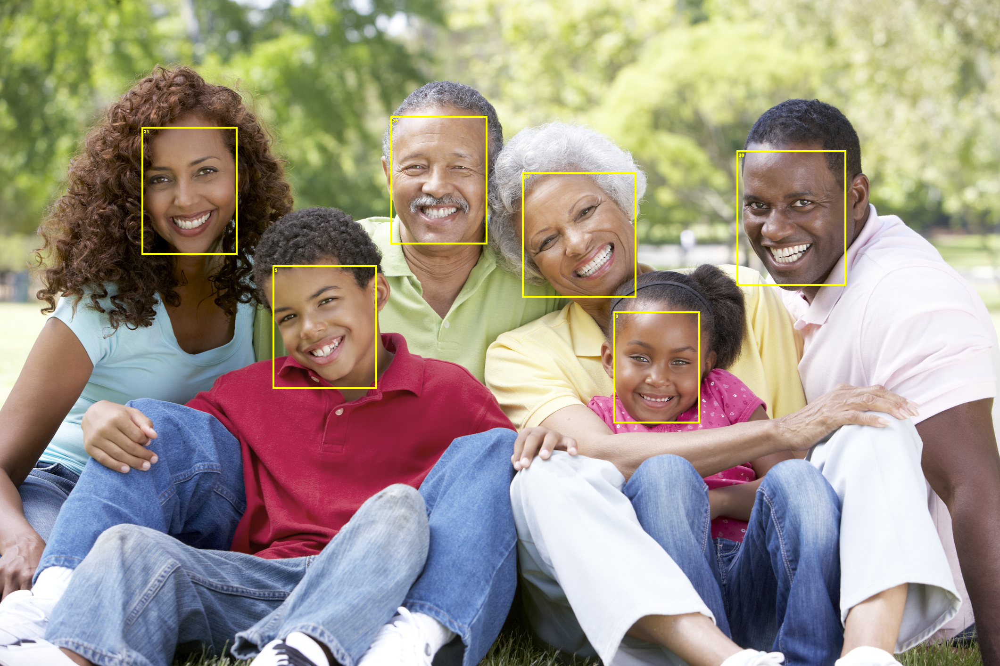

In [ ]:
inference(face_detection_model, age_estimation_model, image, test_transform)

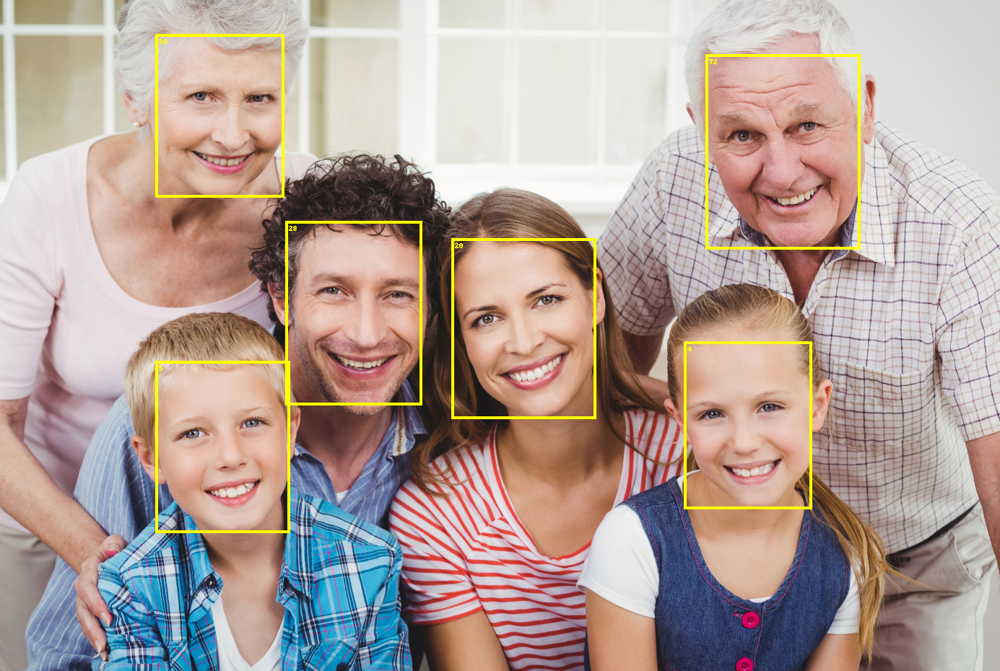

In [ ]:
image = Image.open('/content/Traditional-Family-Life.jpg')
inference(face_detection_model, age_estimation_model, image, test_transform)

# 🔴 **Experiments**

## 🟠 Train and evaluate the model using various datasets.

### 🔵 **Train CACD2000**

In [ ]:
model_cacd2000 = AgeEstimationModel().to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
train_loss_hist_cacd2000, valid_loss_hist_cacd2000 = [], []
train_metric_hist_cacd2000, valid_metric_hist_cacd2000 = [], []
best_metric_cacd2000 = torch.inf

In [ ]:
lr = 0.001
wd = 1e-5
optimizer = torch.optim.SGD(model_cacd2000.parameters(), lr = lr, momentum = 0.9, weight_decay = wd)
loss_func = torch.nn.L1Loss()
metric    = tm.MeanAbsoluteError().to(device)

In [ ]:
start, stop = 0, 5

for  epoch in range(start, stop):
  model, train_loss, metric_train = train_one_epoch(model_cacd2000, train_loader_cacd2000, loss_func, optimizer, metric, epoch)
  valid_loss, metric_valid        = evaluate(model_cacd2000, valid_loader_cacd2000, loss_func, metric)

  train_loss_hist_cacd2000.append(train_loss)
  train_metric_hist_cacd2000.append(metric_train)
  valid_loss_hist_cacd2000.append(valid_loss)
  valid_metric_hist_cacd2000.append(metric_valid)

  if metric_valid<best_metric_cacd2000:

    best_metric_cacd2000 = metric_valid

    torch.save(model_cacd2000, 'best_model_cacd2000.pt')
    print('model saved!')

### 🔵 **Plot CACD2000**

In [ ]:
plt.figure(figsize = (13, 5))
plt.subplot(1, 2, 1)
plt.plot(range(0, stop), train_loss_hist_cacd2000, label = 'train loss')
plt.plot(range(0, stop), valid_loss_hist_cacd2000, label = 'valid loss')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.subplot(1, 2, 2)
plt.plot(range(0, stop), train_metric_hist_cacd2000, label = 'train metric')
plt.plot(range(0, stop), valid_metric_hist_cacd2000, label = 'valid metric')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Metric')
plt.show()

### 🔵 **Train MegaAge**

In [ ]:
model_megaage = AgeEstimationModel().to(device)

In [ ]:
train_loss_hist_megaage, valid_loss_hist_megaage = [], []
best_loss_megaage = torch.inf

In [ ]:
lr = 0.001
wd = 1e-3
optimizer = torch.optim.SGD(model_megaage.parameters(), lr = lr, momentum = 0.9, weight_decay = wd)
loss_func = torch.nn.L1Loss()
metric    = tm.MeanAbsoluteError().to(device)

In [ ]:
start, stop = 10, 15

for  epoch in range(start, stop):
  model, train_loss = train_one_epoch(model_megaage, train_loader_megaage, loss_func, optimizer, metric, epoch)
  valid_loss        = evaluate(model_megaage, valid_loader_megaage, loss_func, metric)

  train_loss_hist_megaage.append(train_loss)
  valid_loss_hist_megaage.append(valid_loss)

  if valid_loss<best_loss_megaage:

    best_loss_megaage = valid_loss

    torch.save(model_megaage, 'best_model_megaage.pt')
    print('model saved!')

Epoch:10: 100%|██████████| 262/262 [04:01<00:00,  1.09batch/s, loss=4.73]


Loss : 5.435342311859131


Epoch:11: 100%|██████████| 262/262 [04:02<00:00,  1.08batch/s, loss=4.67]


Loss : 5.812214374542236


Epoch:12: 100%|██████████| 262/262 [04:05<00:00,  1.07batch/s, loss=4.64]


Loss : 5.521821975708008


Epoch:13: 100%|██████████| 262/262 [04:10<00:00,  1.04batch/s, loss=4.52]


Loss : 5.672348976135254


Epoch:14: 100%|██████████| 262/262 [04:02<00:00,  1.08batch/s, loss=4.54]


Loss : 5.589822769165039


### 🔵 **Plot**

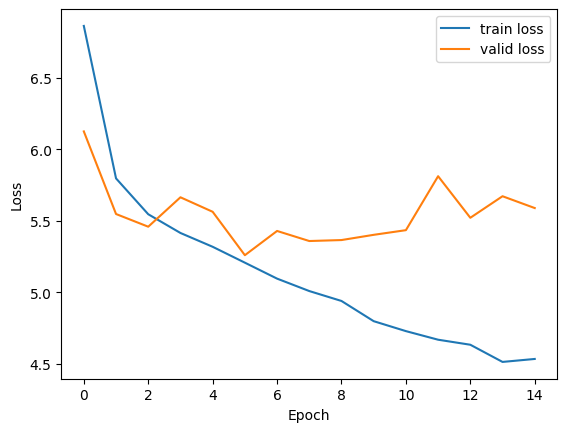

In [ ]:
plt.plot(range(0, stop), train_loss_hist_megaage, label = 'train loss')
plt.plot(range(0, stop), valid_loss_hist_megaage, label = 'valid loss')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

## 🟠 Train the model using one dataset and then test it on a different one.

In [ ]:
model_utkface = torch.load('/content/drive/MyDrive/best_model.pt').to(device)
model_megaage = torch.load('/content/best_model_megaage.pt').to(device)

In [ ]:
Loss    = []

models  = [model_utkface, model_megaage]
test_loaders = [test_loader, test_loader_cacd2000, test_loader_megaage]

for model in models:
  model.eval()

  for test in test_loaders:
    with torch.no_grad():
      loss = evaluate(model, test, loss_func, None)

    Loss.append(loss)

Loss : 3.1836676597595215
Loss : 13.270262718200684
Loss : 8.088703155517578
Loss : 16.410005569458008
Loss : 15.051714897155762
Loss : 5.340469837188721


In [ ]:
pd.DataFrame(np.array(Loss).reshape(2, 3), index = ['model_utkface', 'model_megaage'], columns = ['test_loader_utkface', 'test_loader_cacd2000', 'test_loader_megaage'])

,test_loader_utkface,test_loader_cacd2000,test_loader_megaage
model_utkface,3.183668,13.270263,8.088703
model_megaage,16.410006,15.051715,5.340470


## 🟠 Analyze the loss value with respect to age, gender and race.

In [ ]:
loss_func = torch.nn.L1Loss(reduction = 'none')

In [ ]:
predicts = None
MAEs     = None
for image, ages, _, _ in test_loader:
  model_utkface.eval()

  image = image.to(device)
  ages  = ages.to(device)

  with torch.no_grad():
    predict = model_utkface(image)
  if predicts == None:
    predicts = predict
    MAEs     = loss_func(ages, predict)
  else:
    predicts = torch.cat([predicts.cpu(), predict.cpu()])
    mae      = loss_func(ages, predict)
    MAEs     = torch.cat([MAEs, mae])

In [ ]:
DF = pd.read_csv('/content/test_set.csv')
DF['predicts'] = predicts.cpu()
DF['MAEs']     = MAEs.cpu()
DF

,image_name,age,gender,ethnicity,predicts,MAEs
0,56_0_2_20170120221539141.jpg.chip.jpg,56,Male,Asian,52.061832,3.938168
1,48_0_1_20170104212527708.jpg.chip.jpg,48,Male,Black,37.583355,10.416645
2,34_0_0_20170117182621262.jpg.chip.jpg,34,Male,White,35.712654,1.712654
3,46_1_1_20170116233714695.jpg.chip.jpg,46,Female,Black,30.642330,15.357670
4,4_0_0_20170110225200150.jpg.chip.jpg,4,Male,White,2.744286,1.255714
...,...,...,...,...,...,...
3470,28_0_1_20170113173600097.jpg.chip.jpg,28,Male,Black,27.365103,0.634897
3471,26_1_3_20170104235102538.jpg.chip.jpg,26,Female,Indian,24.595325,1.404675
3472,34_0_1_20170116193910144.jpg.chip.jpg,34,Male,Black,30.603573,3.396427
3473,60_1_0_20170117174613438.jpg.chip.jpg,60,Female,White,43.054989,16.945011


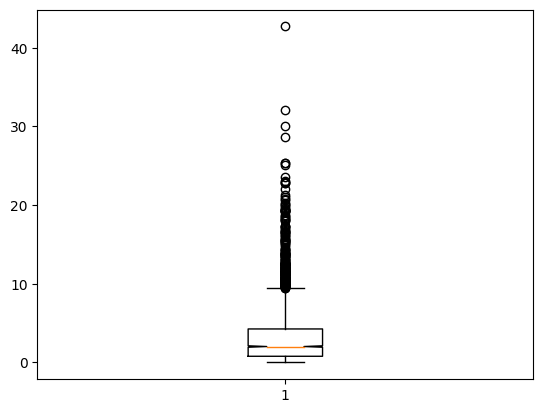

In [ ]:
plt.boxplot(DF.MAEs, DF.age.any())
plt.show()

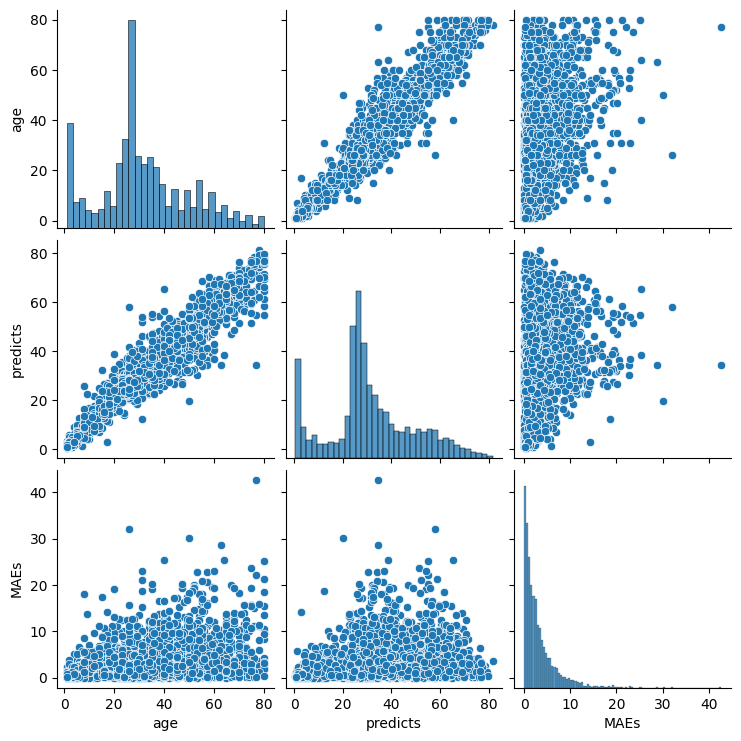

In [ ]:
sns.pairplot(DF)
plt.show()

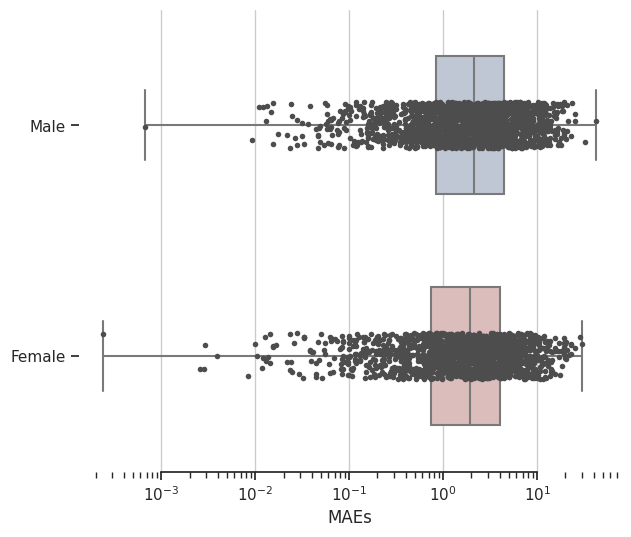

In [ ]:
sns.set_theme(style="ticks")
f, ax = plt.subplots(figsize=(7, 6))
ax.set_xscale("log")
sns.boxplot(x="MAEs", y="gender", data=DF,
            whis=[0, 100], width=.6, palette="vlag")
sns.stripplot(x="MAEs", y="gender", data=DF,
              size=4, color=".3", linewidth=0)
ax.xaxis.grid(True)
ax.set(ylabel="")
sns.despine(trim=True, left=True)

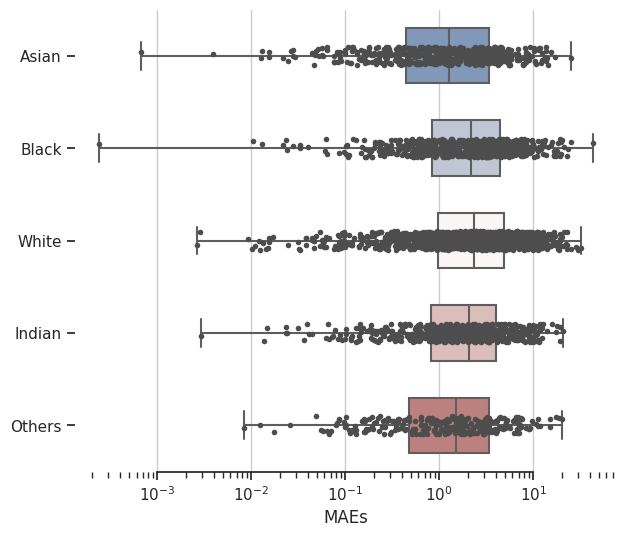

In [ ]:
sns.set_theme(style="ticks")
f, ax = plt.subplots(figsize=(7, 6))
ax.set_xscale("log")
sns.boxplot(x="MAEs", y="ethnicity", data=DF,
            whis=[0, 100], width=.6, palette="vlag")
sns.stripplot(x="MAEs", y="ethnicity", data=DF,
              size=4, color=".3", linewidth=0)
ax.xaxis.grid(True)
ax.set(ylabel="")
sns.despine(trim=True, left=True)

<ipython-input-170-12ef52118c01>:4: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  g = sns.relplot(


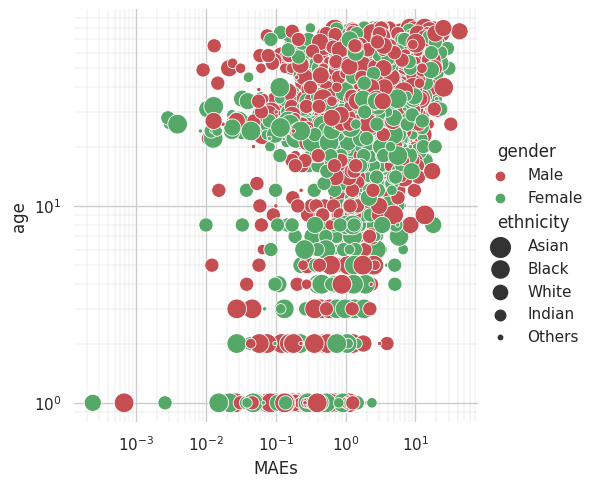

In [ ]:
sns.set_theme(style="whitegrid")

cmap = sns.cubehelix_palette(rot=-.2, as_cmap=True)
g = sns.relplot(
    data=DF,
    x="MAEs", y="age",
    hue="gender", size="ethnicity",
    palette=['r', 'g', 'b'], sizes=(10, 200),
)
g.set(xscale="log", yscale="log")
g.ax.xaxis.grid(True, "minor", linewidth=.25)
g.ax.yaxis.grid(True, "minor", linewidth=.25)
g.despine(left=True, bottom=True)
plt.show()

<Axes: xlabel='age', ylabel='MAEs'>

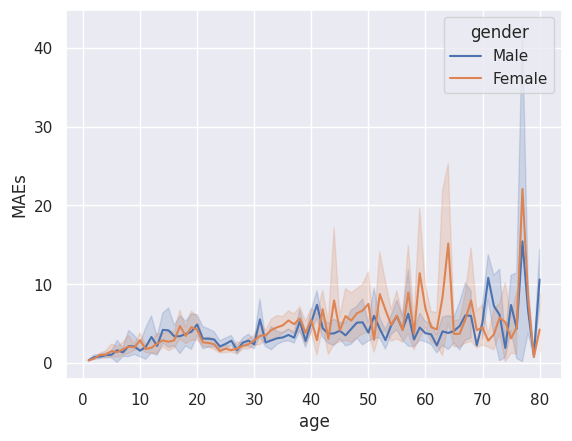

In [ ]:
sns.set_theme(style="darkgrid")

sns.lineplot(x="age", y="MAEs",
             hue="gender",
             data=DF)

In [ ]:
DF.describe()

,age,predicts,MAEs
count,3475.000000,3475.000000,3475.000000
mean,32.010360,31.416735,3.206262
std,18.197025,17.317631,3.683598
min,1.000000,0.581679,0.000241
25%,23.000000,23.812194,0.788967
50%,29.000000,28.522097,2.027645
75%,42.000000,40.929665,4.260941
max,80.000000,81.549026,42.699997


In [ ]:
DF.groupby('gender').describe()

age                                                    predicts  \
         count       mean        std  min   25%   50%   75%   max    count   
gender                                                                       
Female  1635.0  28.929664  17.163604  1.0  21.0  26.0  36.0  80.0   1635.0   
Male    1840.0  34.747826  18.650604  1.0  25.0  32.0  48.0  80.0   1840.0   

                   ...                          MAEs                      \
             mean  ...        75%        max   count      mean       std   
gender             ...                                                     
Female  28.243979  ...  33.598099  79.685692  1635.0  3.049943  3.565404   
Male    34.236008  ...  46.719049  81.549026  1840.0  3.345165  3.781073   

                                                           
             min       25%       50%       75%        max  
gender                                                     
Female  0.000241  0.740179  1.919609  4.049918  30.074203  
Male    0.000678  0.831659  2.150439  4.465266  42.699997  

[2 rows x 24 columns]

In [ ]:
DF.groupby('age').describe()

predicts                                                         \
       count       mean        std        min        25%        50%   
age                                                                   
1      168.0   1.233189   0.442580   0.581679   0.942221   1.131230   
2       72.0   1.926990   0.910352   0.823286   1.347184   1.709724   
3       43.0   2.684924   1.066114   1.156554   1.817566   2.445390   
4       41.0   3.683438   1.338928   1.675295   3.010063   3.380947   
5       29.0   5.365658   1.693912   2.469823   4.314875   4.942306   
..       ...        ...        ...        ...        ...        ...   
76       8.0  72.191772   6.128860  60.960258  70.030466  75.087746   
77       4.0  59.913136  19.613165  34.300003  49.775010  64.262564   
78      10.0  72.235489   6.036098  62.116711  67.514797  73.166264   
79       3.0  78.566895   1.009780  77.750465  78.002323  78.254181   
80      20.0  71.312950   7.360414  54.930027  66.037376  73.703236   

                            MAEs                                            \
           75%        max  count       mean        std       min       25%   
age                                                                          
1     1.428016   3.384666  168.0   0.339002   0.367382  0.000241  0.090755   
2     2.144141   5.916302   72.0   0.655737   0.630951  0.027747  0.211678   
3     3.193231   5.226903   43.0   0.935663   0.584744  0.027740  0.505414   
4     4.038472   9.076790   41.0   1.021919   0.908305  0.038472  0.448238   
5     6.033370  10.045781   29.0   1.231479   1.198799  0.012229  0.423236   
..         ...        ...    ...        ...        ...       ...       ...   
76   75.553234  78.527283    8.0   4.440044   5.622011  0.117874  0.556396   
77   74.400688  76.827408    4.0  17.086864  19.613165  0.172592  2.599312   
78   75.274992  81.549026   10.0   6.735087   4.791107  1.303848  3.558144   
79   78.975109  79.696037    3.0   0.897130   0.306204  0.696037  0.720928   
80   77.211897  79.685692   20.0   8.687049   7.360414  0.314308  2.788103   

                                      
           50%        75%        max  
age                                   
1     0.230586   0.428016   2.384666  
2     0.546902   0.855256   3.916302  
3     0.755681   1.388035   2.226903  
4     0.866886   1.154207   5.076790  
5     0.751265   1.768418   5.045781  
..         ...        ...        ...  
76    1.897697   5.969534  15.039742  
77   12.737436  27.224990  42.699997  
78    4.833736  10.485203  15.883289  
79    0.745819   0.997677   1.249535  
80    6.296764  13.962624  25.069973  

[80 rows x 16 columns]

In [ ]:
DF.groupby('ethnicity').describe()

age                                                      \
            count       mean        std  min    25%   50%   75%   max   
ethnicity                                                               
Asian       508.0  24.608268  17.696379  1.0   6.75  26.0  32.0  80.0   
Black       673.0  33.184250  14.677341  1.0  26.00  30.0  38.0  80.0   
Indian      577.0  30.790295  16.116310  1.0  24.00  28.0  40.0  80.0   
Others      275.0  23.738182  13.274633  1.0  17.00  25.0  30.0  76.0   
White      1442.0  36.135922  19.992041  1.0  23.00  35.0  52.0  80.0   

          predicts             ...                          MAEs            \
             count       mean  ...        75%        max   count      mean   
ethnicity                      ...                                           
Asian        508.0  23.680422  ...  29.131330  81.549026   508.0  2.443527   
Black        673.0  32.361431  ...  36.602211  74.414505   673.0  3.395501   
Indian       577.0  30.335524  ...  38.232872  79.685692   577.0  3.016388   
Others       275.0  24.115118  ...  29.409898  64.805496   275.0  2.553743   
White       1442.0  35.526360  ...  50.305004  79.303848  1442.0  3.587060   

                                                                        
                std       min       25%       50%       75%        max  
ethnicity                                                               
Asian      3.089779  0.000678  0.447452  1.259648  3.395783  25.354401  
Black      4.082639  0.000241  0.845985  2.166046  4.444384  42.699997  
Indian     3.208406  0.002947  0.825541  2.056324  4.008553  20.614937  
Others     3.138666  0.008368  0.476658  1.508484  3.341451  20.119648  
White      3.889713  0.002611  0.976575  2.315993  4.836009  32.059559  

[5 rows x 24 columns]

In [ ]:
DF[DF['gender'] == 'Male'].groupby('ethnicity').describe()

age                                                     predicts  \
           count       mean        std  min   25%   50%    75%   max    count   
ethnicity                                                                       
Asian      241.0  27.033195  21.738956  1.0   3.0  26.0  39.00  80.0    241.0   
Black      358.0  35.910615  15.539517  1.0  27.0  32.0  44.75  80.0    358.0   
Indian     335.0  34.355224  16.471599  1.0  26.0  34.0  47.00  72.0    335.0   
Others     118.0  28.347458  14.440196  1.0  23.0  27.0  36.75  76.0    118.0   
White      788.0  37.704315  19.473505  1.0  26.0  37.0  53.00  80.0    788.0   

                      ...                         MAEs                      \
                mean  ...        75%        max  count      mean       std   
ethnicity             ...                                                    
Asian      26.139061  ...  36.755829  81.549026  241.0  2.844523  3.670409   
Black      34.933723  ...  42.377634  74.414505  358.0  3.601797  4.507795   
Indian     34.141735  ...  46.130352  64.738106  335.0  3.090449  3.207064   
Others     28.742310  ...  36.130749  64.805496  118.0  2.773278  3.555507   
White      37.258114  ...  52.129301  79.303848  788.0  3.575612  3.687820   

                                                              
                min       25%       50%       75%        max  
ethnicity                                                     
Asian      0.000678  0.449453  1.325356  3.916594  25.354401  
Black      0.012934  0.892190  2.256258  4.539921  42.699997  
Indian     0.023615  0.844753  2.056324  4.302105  19.328226  
Others     0.017614  0.535552  1.631747  3.233881  18.725994  
White      0.009155  1.004653  2.400670  4.936140  32.059559  

[5 rows x 24 columns]

In [ ]:
DF[DF['gender'] == 'Female'].groupby('ethnicity').describe()

age                                                     predicts  \
           count       mean        std  min    25%   50%   75%   max    count   
ethnicity                                                                       
Asian      267.0  22.419476  12.663520  1.0  20.00  26.0  28.0  75.0    267.0   
Black      315.0  30.085714  12.976300  1.0  24.50  28.0  35.0  74.0    315.0   
Indian     242.0  25.855372  14.235415  1.0  21.00  26.0  31.0  80.0    242.0   
Others     157.0  20.273885  11.178970  1.0  12.00  24.0  26.0  51.0    157.0   
White      654.0  34.246177  20.455134  1.0  19.25  30.0  50.0  80.0    654.0   

                      ...                         MAEs                      \
                mean  ...        75%        max  count      mean       std   
ethnicity             ...                                                    
Asian      21.461201  ...  26.514794  76.070381  267.0  2.081579  2.400820   
Black      29.438002  ...  32.086601  74.162903  315.0  3.161044  3.530571   
Indian     25.066591  ...  28.858741  79.685692  242.0  2.913867  3.214085   
Others     20.637360  ...  26.917389  55.119648  157.0  2.388743  2.785267   
White      33.439777  ...  46.113166  78.527283  654.0  3.600852  4.122678   

                                                              
                min       25%       50%       75%        max  
ethnicity                                                     
Asian      0.003950  0.435683  1.218821  2.964736  14.307959  
Black      0.000241  0.766908  2.054733  4.286346  22.748796  
Indian     0.002947  0.799660  2.044319  3.444284  20.614937  
Others     0.008368  0.451605  1.497414  3.352438  20.119648  
White      0.002611  0.945781  2.207268  4.686486  30.074203  

[5 rows x 24 columns]

In [ ]:
data = np.array([['n = 241, mae = 2.844', 'n = 358, mae = 3.601', 'n = 335, mae = 3.090', 'n = 788, mae = 3.575', 'n = 118, mae = 2.773', 'n = 1840, mae = 3.345'],
                 ['n = 267, mae = 2.081', 'n = 315, mae = 3.161', 'n = 242, mae = 2.913', 'n = 654, mae = 3.600', 'n = 157, mae = 2.388', 'n = 1635, mae = 3.049']])

In [ ]:
pd.DataFrame(data, index = ['Male', 'Female'], columns = ['Asian', 'Black', 'Indian', 'White', 'Others', 'all'])

,Asian,Black,Indian,White,Others,all
Male,"n = 241, mae = 2.844","n = 358, mae = 3.601","n = 335, mae = 3.090","n = 788, mae = 3.575","n = 118, mae = 2.773","n = 1840, mae = 3.345"
Female,"n = 267, mae = 2.081","n = 315, mae = 3.161","n = 242, mae = 2.913","n = 654, mae = 3.600","n = 157, mae = 2.388","n = 1635, mae = 3.049"


## 🟠 Analyze the model's sensitivity.

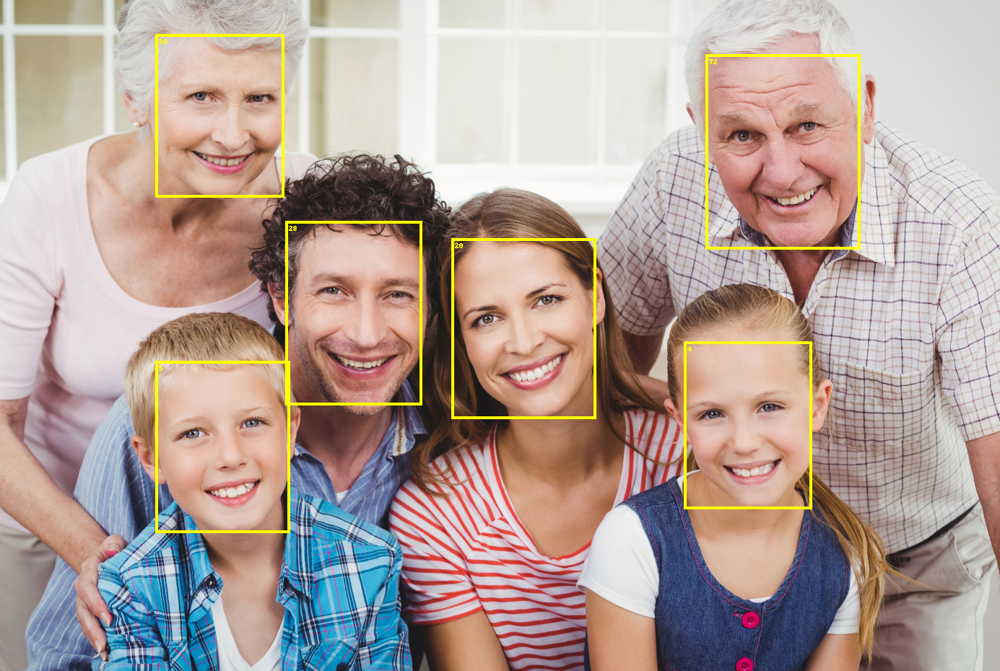

In [ ]:
image = Image.open('/content/Traditional-Family-Life.jpg')
inference(face_detection_model, model_utkface, image, test_transform)

In [ ]:
def sensivity(image, n_change):
  model.eval()

  images_mod = []
  for i in range(n_change):
    new_image = transforms.Compose([transforms.RandomRotation(15), transforms.ColorJitter(brightness = 0.5), transforms.RandomHorizontalFlip()])(image)
    new_image = inference(face_detection_model, model_utkface, new_image, test_transform)
    images_mod.append(new_image)

  imgs = images_mod
  min_shape = sorted( [(np.sum(i.size), i.size ) for i in imgs])[0][1]
  imgs_comb = np.vstack([i.resize(min_shape) for i in imgs])
  imgs_comb = Image.fromarray( imgs_comb)

  return imgs_comb

In [ ]:
images = sensivity(image, 10)

In [ ]:
images

## 🟠 Create a heatmap for the face images.

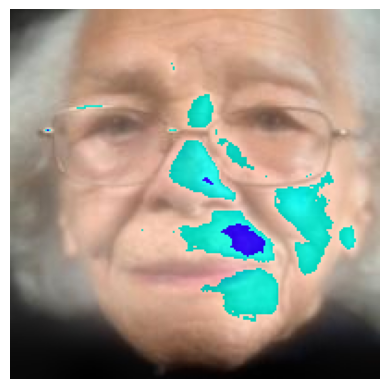

In [ ]:
import torch
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

model = torch.load('/content/drive/MyDrive/best_model.pt', map_location=torch.device('cpu')).resnet
model.eval()

image_path = '/content/UTKFace/100_1_0_20170112215032192.jpg.chip.jpg'
image = Image.open(image_path).convert('RGB')
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])
input_tensor = preprocess(image)
input_batch = input_tensor.unsqueeze(0)

with torch.no_grad():
    features = model.conv1(input_batch)
    features = model.bn1(features)
    features = model.relu(features)
    features = model.maxpool(features)
    features = model.layer1(features)
    features = model.layer2(features)
    features = model.layer3(features)
    features = model.layer4(features)

    heatmap = features.squeeze().sum(0)
    heatmap = heatmap.detach().cpu().numpy()

heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min())
heatmap = np.uint8(255 * heatmap)
heatmap = np.expand_dims(heatmap, axis=2)
heatmap = np.repeat(heatmap, 3, axis=2)
heatmap = Image.fromarray(heatmap)
heatmap = heatmap.resize(image.size)

overlayed_image = np.uint8(1 * np.array(image) + 0.4 * np.array(heatmap))

plt.imshow(overlayed_image, cmap = 'hot')
plt.axis('off')
plt.show()